In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv('Dataset3.csv')

In [3]:
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [4]:
import folium as fl

In [5]:
df.columns

Index(['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address',
       'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines',
       'Average Cost for two', 'Currency', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu',
       'Price range', 'Aggregate rating', 'Rating color', 'Rating text',
       'Votes'],
      dtype='object')

In [6]:
#converting the columns Name , Latitude and Longitude to the List

a_list = df[['Restaurant Name','Latitude','Longitude']].values.tolist()

In [7]:
# creating a map based on just one latitude and longitude

rest_map = fl.Map(location=[40.984776,29.026016])

In [8]:
rest_map.add_child(fl.Marker(location=[40.984776,29.026016],icon=fl.Icon(color='blue')))

In [9]:
# adding the feature group to the map

fg = fl.FeatureGroup(name='_Restuarents_')

for i in a_list:
    fg.add_child(fl.Marker(location=[i[1],i[2]],popup=i[0],icon=fl.Icon(color='blue')))

rest_map.add_child(fg)    

In [10]:
#saving the map in the file named rest.html

rest_map.save('rest.html')

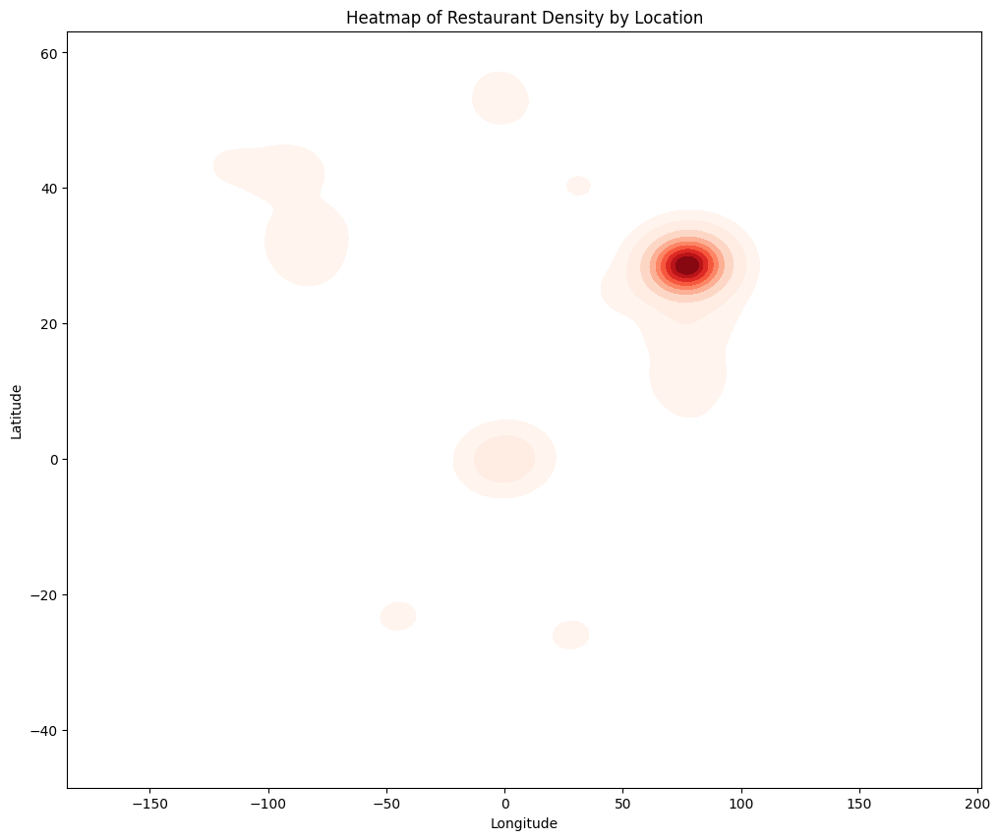

In [11]:
# Locatiob based analysis

# heapmap

plt.figure(figsize=(12, 10))
sns.kdeplot(data=df, x='Longitude', y='Latitude', cmap='Reds', fill=True)
plt.title('Heatmap of Restaurant Density by Location')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()


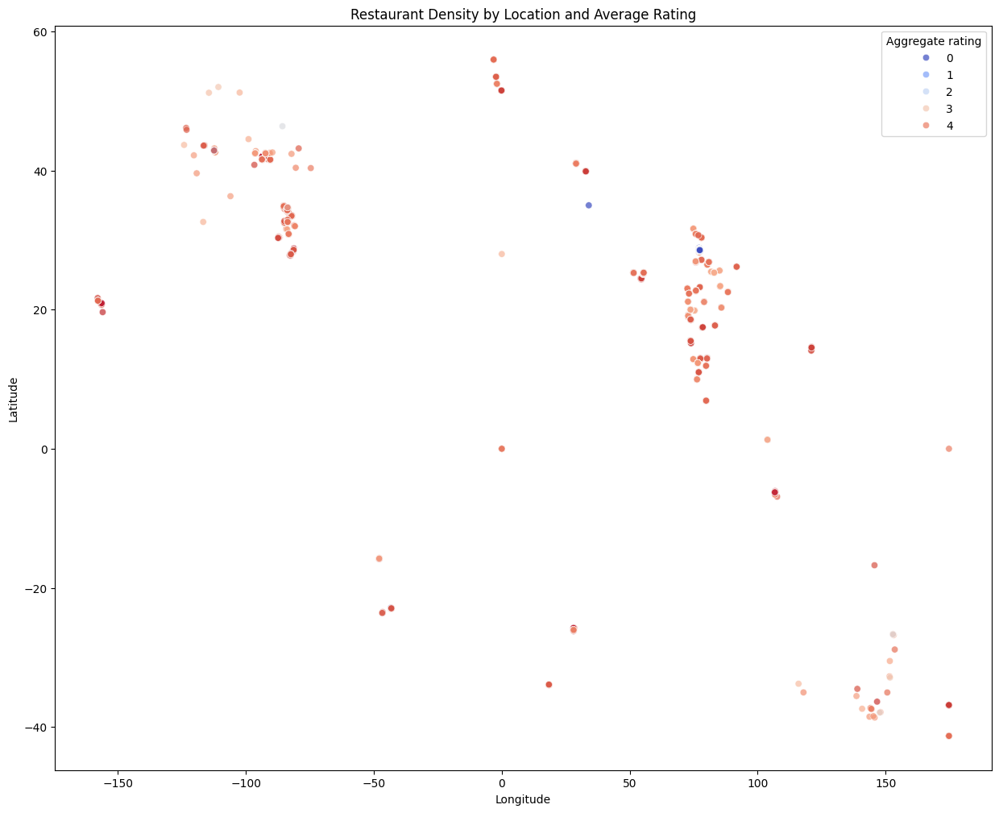

In [12]:
#plottig the scatter plot on the longitude and latitude hue of avg rating 
plt.figure(figsize=(15,12))
sns.scatterplot(data=df, x='Longitude', y='Latitude', hue='Aggregate rating', palette='coolwarm', alpha=0.7)
plt.title('Restaurant Density by Location and Average Rating')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

C:\Users\Atharv\AppData\Local\Temp\ipykernel_19116\223150730.py:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=cuisine_diversity.sort_values('Unique Cuisines', ascending=False).head(10),


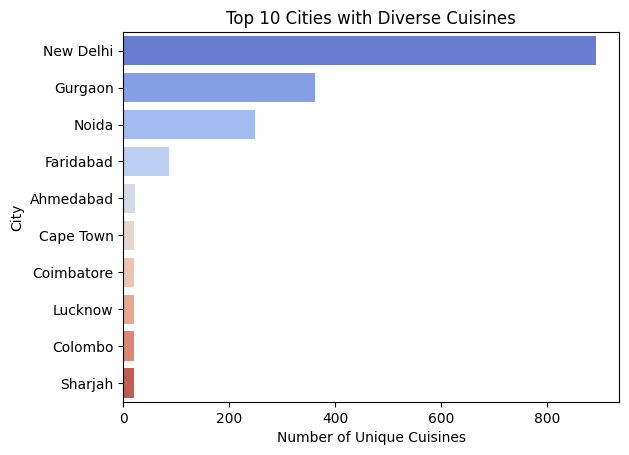

In [13]:
#Cuisine Diversity Analysis

cuisine_diversity = df.groupby('City')['Cuisines'].nunique().reset_index(name='Unique Cuisines')
sns.barplot(data=cuisine_diversity.sort_values('Unique Cuisines', ascending=False).head(10), 
            x='Unique Cuisines', y='City', palette='coolwarm')
plt.title('Top 10 Cities with Diverse Cuisines')
plt.xlabel('Number of Unique Cuisines')
plt.ylabel('City')
plt.show()


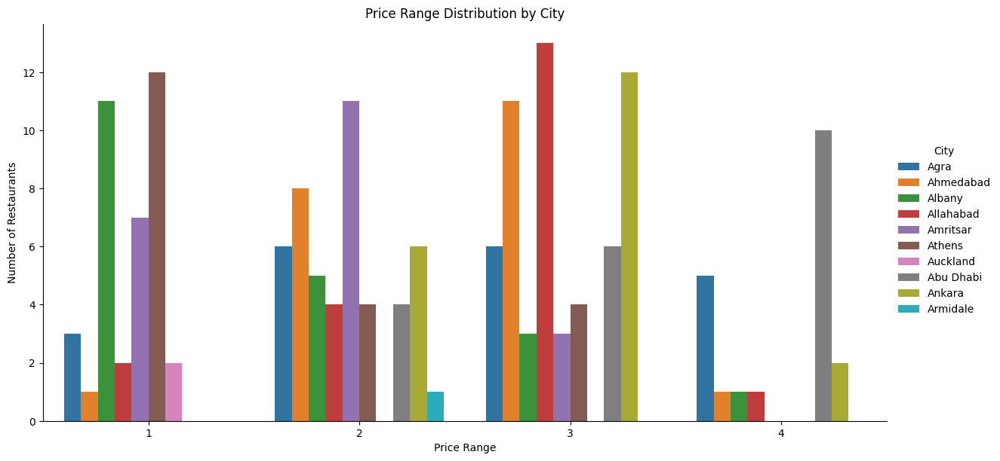

In [14]:
#Price Range Distribution

price_distribution = df.groupby(['City', 'Price range']).size().reset_index(name='Count').head(30)
sns.catplot(data=price_distribution, kind='bar', x='Price range', y='Count', hue='City', height=6, aspect=2)
plt.title('Price Range Distribution by City')
plt.xlabel('Price Range')
plt.ylabel('Number of Restaurants')
plt.show()


In [15]:
#Analyze Features by Popularity

feature_analysis = df.groupby(['City']).agg(
    Table_Booking_Count=('Has Table booking', 'sum'),
    Online_Delivery_Count=('Has Online delivery', 'sum'),
    Avg_Rating=('Aggregate rating', 'mean'),
    Total_Restaurants=('Restaurant ID', 'count'),
    Avg_Cost=('Average Cost for two', 'mean'),
    Total_Votes=('Votes', 'sum')
).reset_index()



In [16]:
# Sort by total restaurants
sorted_data = feature_analysis.sort_values(by='Total_Restaurants', ascending=False)

# Filter for cities with more than 10 restaurants
filtered_data = sorted_data[sorted_data['Total_Restaurants'] > 10]


C:\Users\Atharv\AppData\Local\Temp\ipykernel_19116\1395265532.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=sorted_data.head(10), x='Total_Restaurants', y='City', palette='viridis')


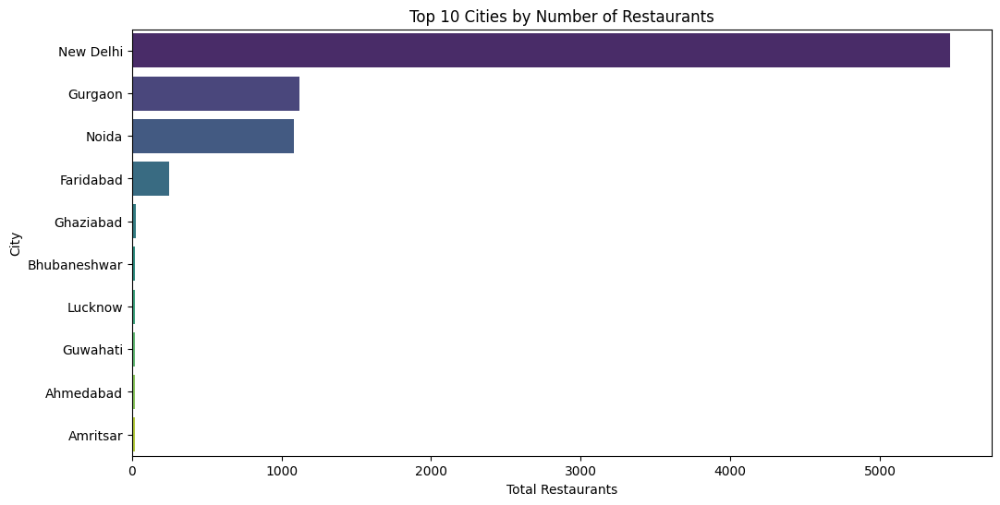

In [17]:
plt.figure(figsize=(12, 6))
sns.barplot(data=sorted_data.head(10), x='Total_Restaurants', y='City', palette='viridis')
plt.title('Top 10 Cities by Number of Restaurants')
plt.xlabel('Total Restaurants')
plt.ylabel('City')
plt.show()

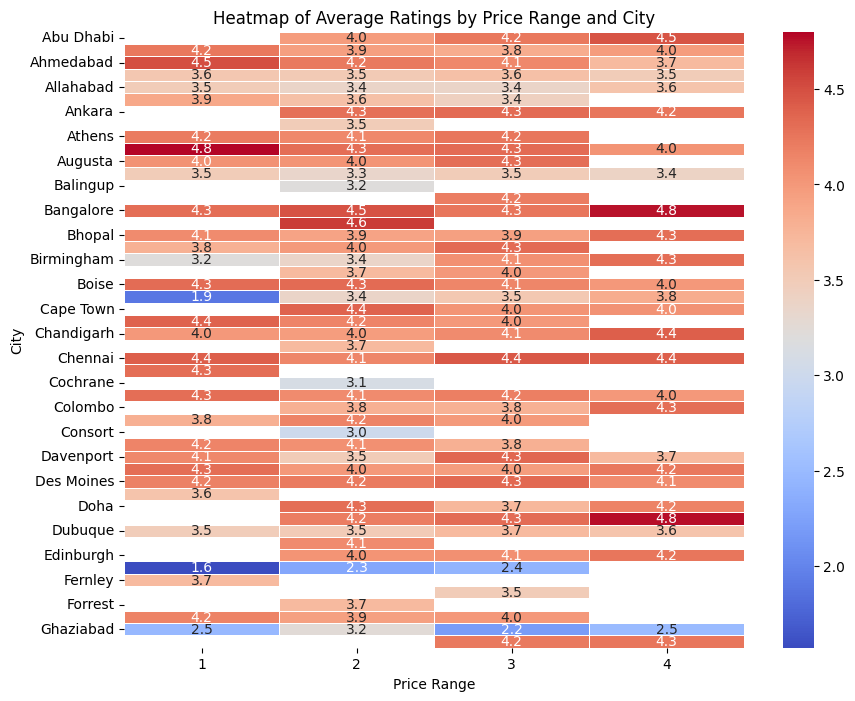

In [18]:
# Group by City and Price range to calculate average rating and total restaurants
price_range_analysis = df.groupby(['City', 'Price range']).agg(
    Avg_Rating=('Aggregate rating', 'mean'),
    Total_Restaurants=('Restaurant ID', 'count')
).reset_index()

# Pivot the data for heatmap
pivot_table = price_range_analysis.pivot(index='City', columns='Price range', values='Avg_Rating').head(50)

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(pivot_table, cmap='coolwarm', annot=True, fmt=".1f", linewidths=.5)
plt.title('Heatmap of Average Ratings by Price Range and City')
plt.xlabel('Price Range')
plt.ylabel('City')
plt.show()

In [19]:
#Identify Cuisine by high ratings
high_rating_cities = feature_analysis[feature_analysis['Avg_Rating'] >= 4.50]
print(high_rating_cities[['City', 'Avg_Rating']].sort_values(by='Avg_Rating', ascending=False))


                 City  Avg_Rating
56         Inner City    4.900000
107       Quezon City    4.800000
73        Makati City    4.650000
95         Pasig City    4.633333
75   Mandaluyong City    4.625000
15         Beechworth    4.600000
67             London    4.535000
123       Taguig City    4.525000
66            Lincoln    4.500000
116      Secunderabad    4.500000
122     Tagaytay City    4.500000


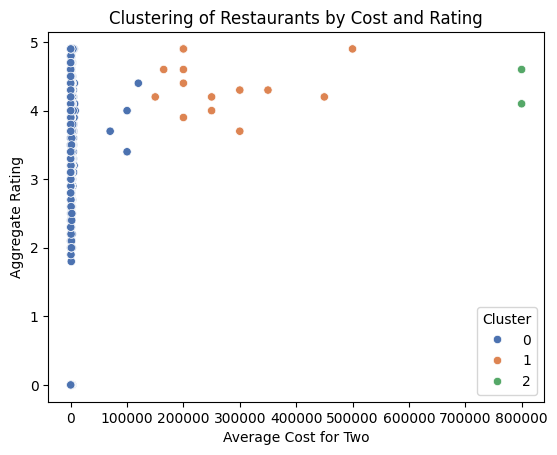

In [20]:
#Trends and Predictions
from sklearn.cluster import KMeans

clustering_data = df[['Average Cost for two', 'Aggregate rating']].dropna()
kmeans = KMeans(n_clusters=3, random_state=42).fit(clustering_data)

df['Cluster'] = kmeans.labels_
sns.scatterplot(data=df, x='Average Cost for two', y='Aggregate rating', hue='Cluster', palette='deep')
plt.title('Clustering of Restaurants by Cost and Rating')
plt.xlabel('Average Cost for Two')
plt.ylabel('Aggregate Rating')
plt.show()
